# imports

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import pandas as pd
import csv
import preparation_hypno as preph
import preparation_edf as prepedf
import neurokit2 as nk
import matplotlib.pyplot as plt
from edfrd import read_header, read_data_records
from preparation_hypno import System
from datetime import time
from datetime import datetime
from datetime import date
from datetime import timedelta
import edfrd
from neurokit2.hrv.hrv_utils import _hrv_get_rri
#from pyedflib.highlevel import anonymize_edf, read_edf

# allocate variables

In [4]:
#Probanden ID
idp = '000'
night = '2'
dia = 'IHS'
#hypnofile = "Schlafprofil.txt"
hypnofile = "Schlafprofil.txt"

In [5]:
dfh = preph.make_df_hypno_all(hypnofile, System.Somnomedics, start_of_hypno= None)
dfh

,Time,Stadium
0,23:24:30,Wach
1,23:25:00,Wach
2,23:25:30,Wach
3,23:26:00,Wach
4,23:26:30,Wach
...,...,...
905,06:57:00,Wach
906,06:57:30,Wach
907,06:58:00,Wach
908,06:58:30,Wach


In [6]:
#öffnen der EDF

In [7]:
#get the edf and read out header 

In [8]:
file_path = 'Probanden/anonymized_sample.edf'
header = read_header(file_path)
header

Header(version='0', local_patient_identification='X F X anonym', local_recording_identification='Startdate 26-JUN-2020 488811941839 X Somnoscreen_Plus_PSG+_4888', startdate_of_recording='26.06.20', starttime_of_recording='23.24.59', number_of_bytes_in_header_record=9216, reserved=None, number_of_data_records=27242, duration_of_a_data_record=1, number_of_signals=35, signals=(SignalHeader(label='E1:M2', transducer_type='', physical_dimension='uV', physical_minimum=-800.0, physical_maximum=800.0, digital_minimum=-32768, digital_maximum=32767, prefiltering='', nr_of_samples_in_each_data_record=256, reserved=None), SignalHeader(label='E2:M2', transducer_type='', physical_dimension='uV', physical_minimum=-800.0, physical_maximum=800.0, digital_minimum=-32768, digital_maximum=32767, prefiltering='', nr_of_samples_in_each_data_record=256, reserved=None), SignalHeader(label='F4:M1', transducer_type='', physical_dimension='uV', physical_minimum=-800.0, physical_maximum=800.0, digital_minimum=-32

In [9]:
ecg_channel, fs = prepedf.get_ecg_channel_and_frequency(file_path)

# Calculation cutpoints from seperate hypnogram

In [10]:
#cutpoints where stadium changes

In [11]:
cutpoints = preph.calculate_cutpoints(dfh)
cutpoints

,Time,Stadium
0,23:24:30,Wach
1,23:40:00,N1
2,23:43:30,N2
3,23:49:30,N3
4,00:10:30,N1
...,...,...
58,06:09:30,Rem
59,06:39:00,Wach
60,06:41:00,N1
61,06:45:00,N2


In [12]:
diff = preph.calculate_cutpoints_diff(cutpoints)
print(diff)

[930, 210, 360, 1260, 30, 330, 150, 60, 600, 270, 780, 1830, 150, 270, 60, 1350, 540, 120, 180, 30, 150, 450, 540, 480, 420, 480, 660, 120, 450, 960, 420, 630, 60, 330, 1410, 120, 240, 510, 1020, 300, 90, 180, 90, 330, 1170, 210, 240, 90, 180, 90, 660, 210, 300, 210, 780, 30, 60, 120, 1770, 120, 240, 30]


In [13]:
diff, difference_between = prepedf.difference_between(header,dfh,diff)

0:00:29
29.0
930
<class 'float'>


In [14]:
print(diff)

[901, 210, 360, 1260, 30, 330, 150, 60, 600, 270, 780, 1830, 150, 270, 60, 1350, 540, 120, 180, 30, 150, 450, 540, 480, 420, 480, 660, 120, 450, 960, 420, 630, 60, 330, 1410, 120, 240, 510, 1020, 300, 90, 180, 90, 330, 1170, 210, 240, 90, 180, 90, 660, 210, 300, 210, 780, 30, 60, 120, 1770, 120, 240, 30]


# Calculation difference start from seperate hypnogram and edf

# cut first diff with difference, diff acts as a pattern for cutting

In [15]:
#get ecg from EDF as stadium sections

In [16]:
ecg_signal = prepedf.get_data_sections(file_path,ecg_channel,diff,True)

In [17]:
#check if length are correct, ecg has to be one longer than diff

In [18]:
print(len(diff))
print(len(ecg_signal))

62
63


In [19]:
#Länge der ersten Epoche
print(diff[0])
#Länge des ersten EKG Abschnitts
print(len(ecg_signal[0])/256)

901
901.0


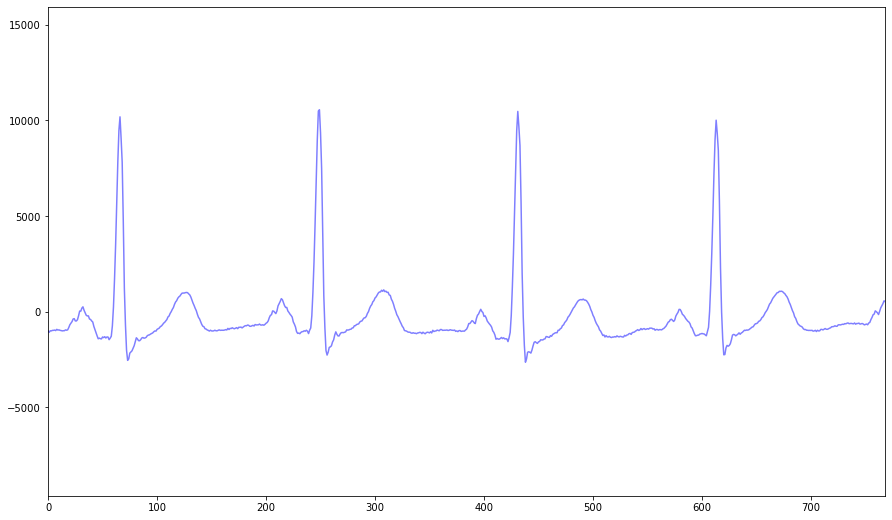

In [20]:
prepedf.plot_raw(ecg_signal[0], 768)

230656
255


<AxesSubplot:>

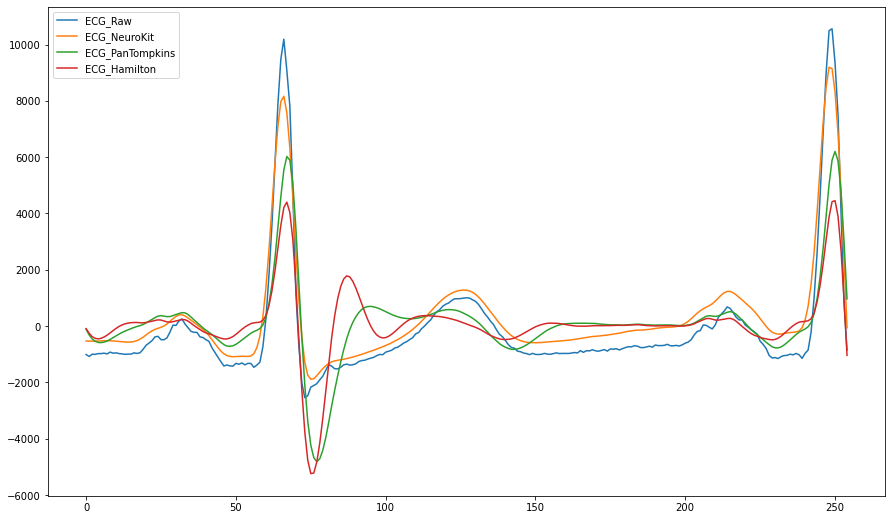

In [21]:
#example plotting for first 3 seconds
#prepedf.plot_raw(ecg_signal[0], 768)
print(len(ecg_signal[0]))
def new_ecg():
    ecg = []
    ekg = ecg_signal[0]
    zaehler = 0
    for i in ekg:
        zaehler = zaehler + 1
        if zaehler < 256:
            ecg.append(i)
    return ecg

ecg = new_ecg()
print(len(ecg))

signals = pd.DataFrame({"ECG_Raw" : ecg,
                        "ECG_NeuroKit" : nk.ecg_clean(ecg, sampling_rate=fs, method="neurokit"),
                        "ECG_PanTompkins" : nk.ecg_clean(ecg, sampling_rate=fs, method="pantompkins1985"),
                        "ECG_Hamilton" : nk.ecg_clean(ecg, sampling_rate=fs, method="hamilton2002")})
signals.plot()

In [22]:
#Liste anlegen aus Epochen und Stadienbezeichnung
list_of_stad_value = prepedf.list_of_stad_values(ecg_signal, cutpoints)

print(list_of_stad_value[0])

{'stadium': ' Wach', 'values': [-1010, -1080, -1000, -1005, -979, -977, -963, -989, -925, -963, -952, -977, -988, -1005, -996, -995, -952, -971, -949, -829, -683, -603, -518, -382, -366, -484, -486, -417, -212, 31, 25, 183, 254, 75, -55, -187, -223, -222, -383, -408, -485, -542, -770, -938, -1105, -1266, -1418, -1382, -1414, -1423, -1324, -1356, -1310, -1377, -1324, -1327, -1466, -1384, -1285, -739, 240, 1744, 3536, 5680, 7841, 9480, 10188, 9075, 7821, 4755, 1209, -681, -2015, -2546, -2470, -2168, -2111, -2047, -1907, -1780, -1568, -1365, -1428, -1516, -1521, -1462, -1376, -1351, -1388, -1374, -1342, -1260, -1225, -1214, -1172, -1143, -1111, -1050, -1008, -1018, -927, -895, -859, -781, -750, -682, -603, -556, -480, -413, -278, -228, -91, 2, 122, 217, 383, 506, 577, 700, 773, 818, 905, 970, 970, 975, 994, 1004, 993, 931, 878, 766, 611, 449, 321, 174, 52, -136, -295, -380, -517, -667, -762, -787, -892, -910, -956, -979, -1014, -970, -1006, -1011, -1003, -970, -997, -1002, -977, -952, -97

In [23]:
print(len(list_of_stad_value))

63


In [24]:
segments = prepedf.segment_epochs(list_of_stad_value)
segments[0]


{'epoch': ' Wach',
 'values': [-1010,
  -1080,
  -1000,
  -1005,
  -979,
  -977,
  -963,
  -989,
  -925,
  -963,
  -952,
  -977,
  -988,
  -1005,
  -996,
  -995,
  -952,
  -971,
  -949,
  -829,
  -683,
  -603,
  -518,
  -382,
  -366,
  -484,
  -486,
  -417,
  -212,
  31,
  25,
  183,
  254,
  75,
  -55,
  -187,
  -223,
  -222,
  -383,
  -408,
  -485,
  -542,
  -770,
  -938,
  -1105,
  -1266,
  -1418,
  -1382,
  -1414,
  -1423,
  -1324,
  -1356,
  -1310,
  -1377,
  -1324,
  -1327,
  -1466,
  -1384,
  -1285,
  -739,
  240,
  1744,
  3536,
  5680,
  7841,
  9480,
  10188,
  9075,
  7821,
  4755,
  1209,
  -681,
  -2015,
  -2546,
  -2470,
  -2168,
  -2111,
  -2047,
  -1907,
  -1780,
  -1568,
  -1365,
  -1428,
  -1516,
  -1521,
  -1462,
  -1376,
  -1351,
  -1388,
  -1374,
  -1342,
  -1260,
  -1225,
  -1214,
  -1172,
  -1143,
  -1111,
  -1050,
  -1008,
  -1018,
  -927,
  -895,
  -859,
  -781,
  -750,
  -682,
  -603,
  -556,
  -480,
  -413,
  -278,
  -228,
  -91,
  2,
  122,
  217,
  383,
  5

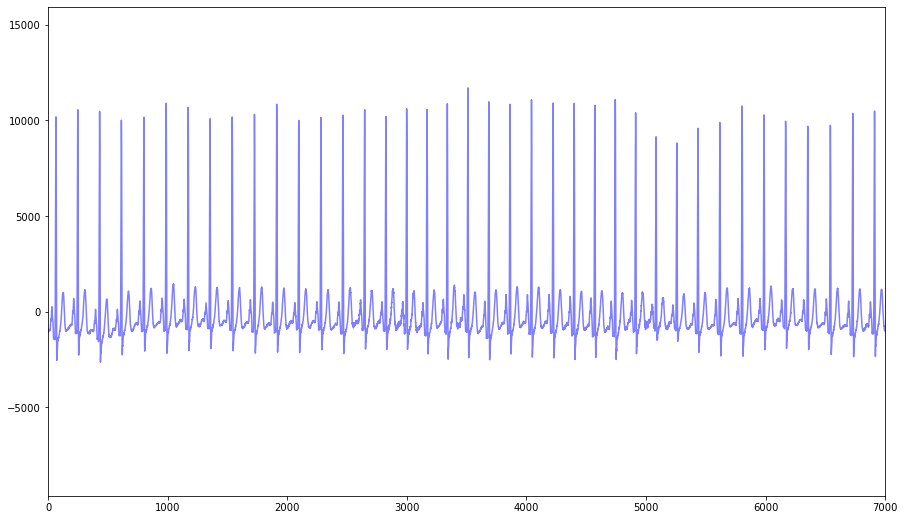

In [25]:
prepedf.plot_raw(segments[0]['values'],7000)

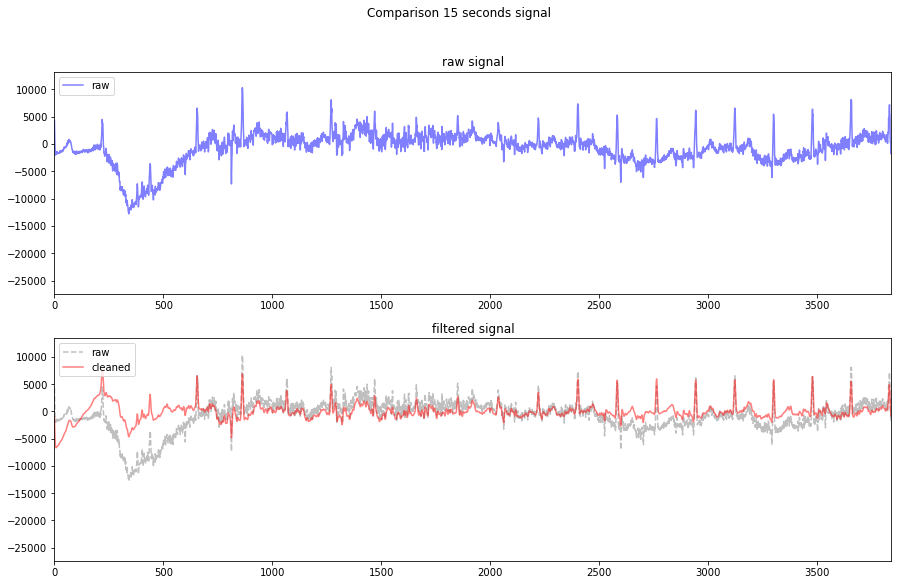

In [26]:
prepedf.plot_compare_signals(segments[35]['values'], 256)
#del segments[2:7]

(<Figure size 1080x648 with 1 Axes>,
 {'ectopic': [27, 28],
  'missed': [23, 88, 103],
  'extra': [],
  'longshort': [1, 5, 24, 25, 26, 84, 104]})

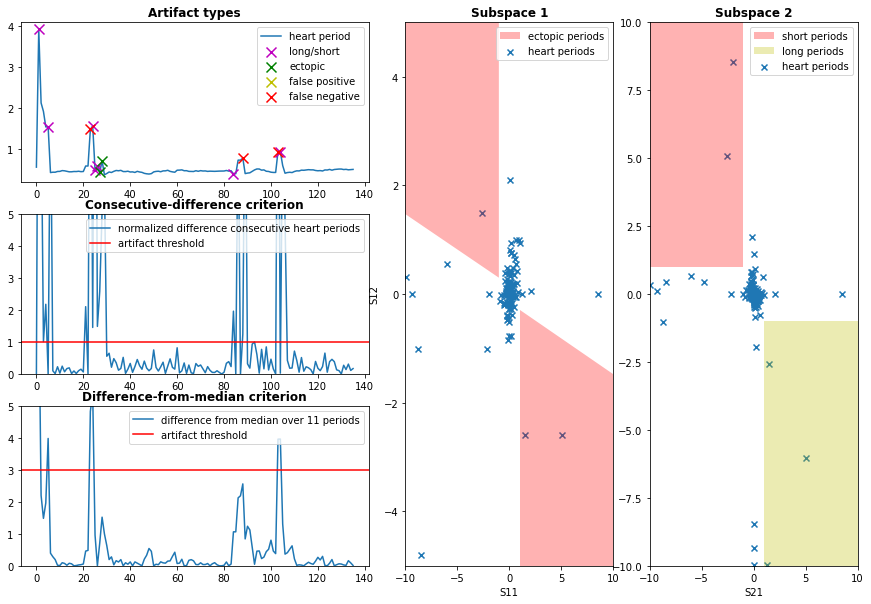

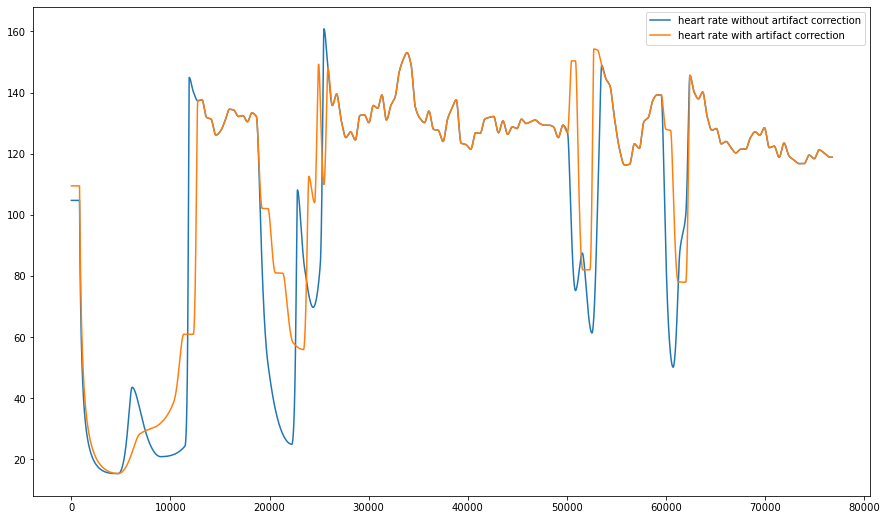

In [27]:
test = segments[35]['values']
#peaktest = test[42000:47000]
#for i in test:
 #   if i>70:
  #      test.pop()
len(test)
#sig = nk.signal_simulate(duration=20, sampling_rate=256, frequency=1)
prepedf.compare_peaks(test)

C:\Users\smend\Masterarbeit\hrv_analysis\preparation_edf.py:266: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax0, ax1) = plt.subplots(nrows=2, ncols=1, sharex=True)


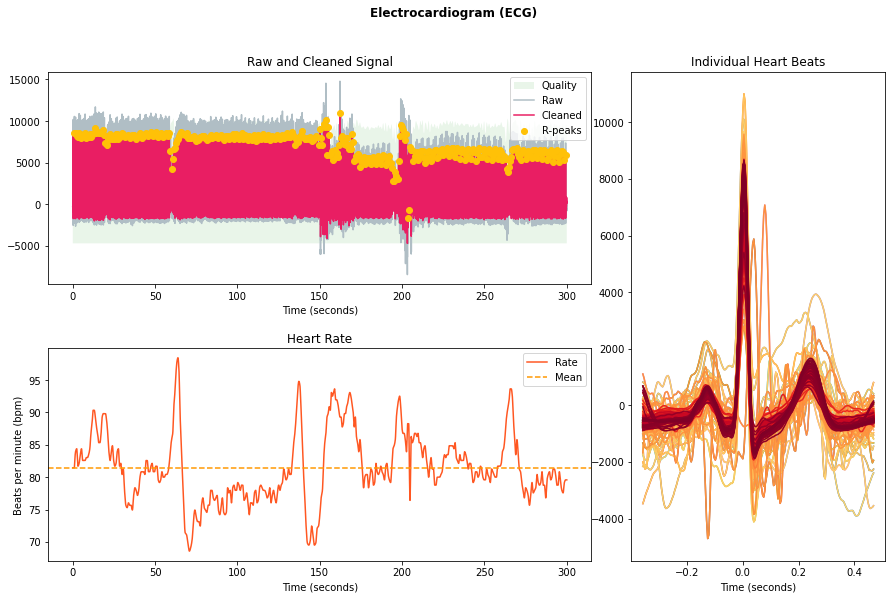

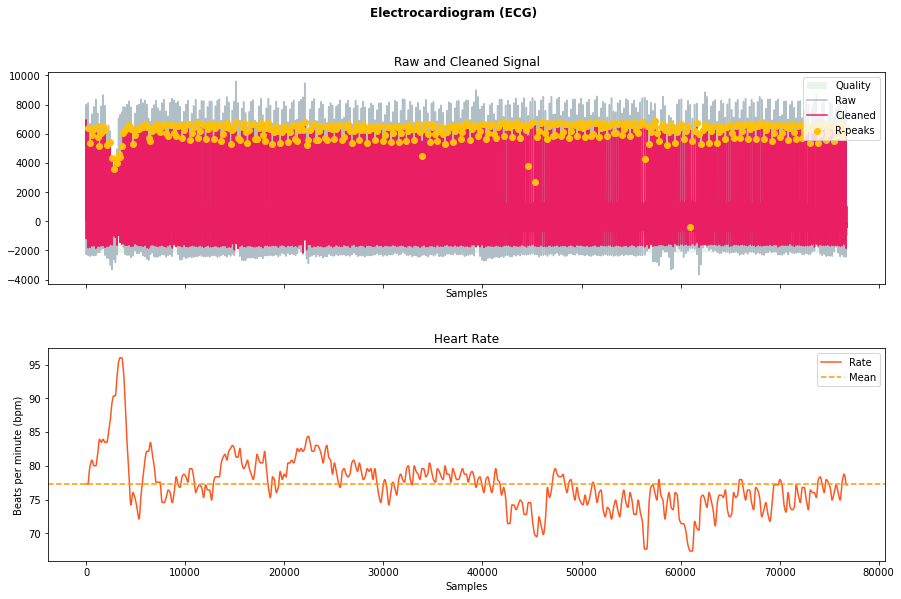

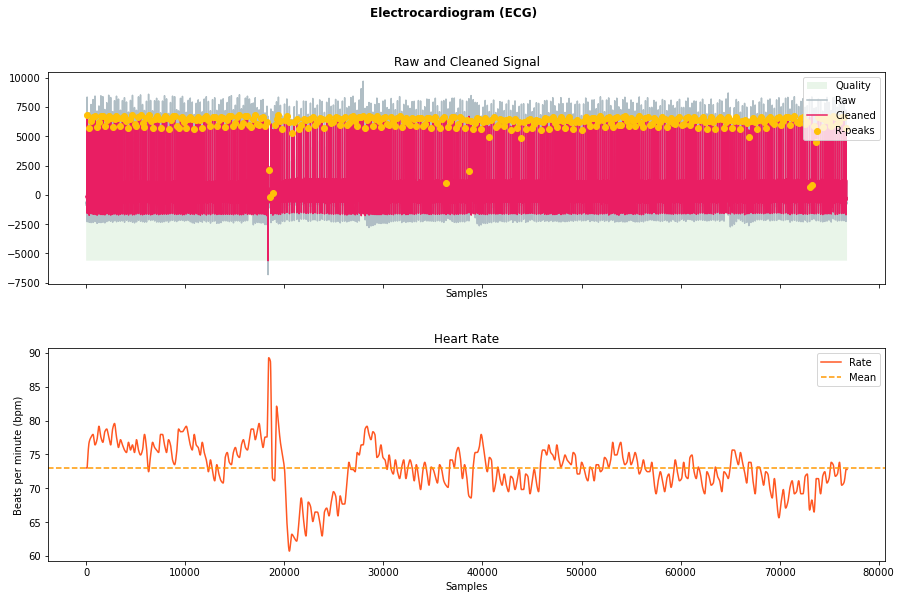

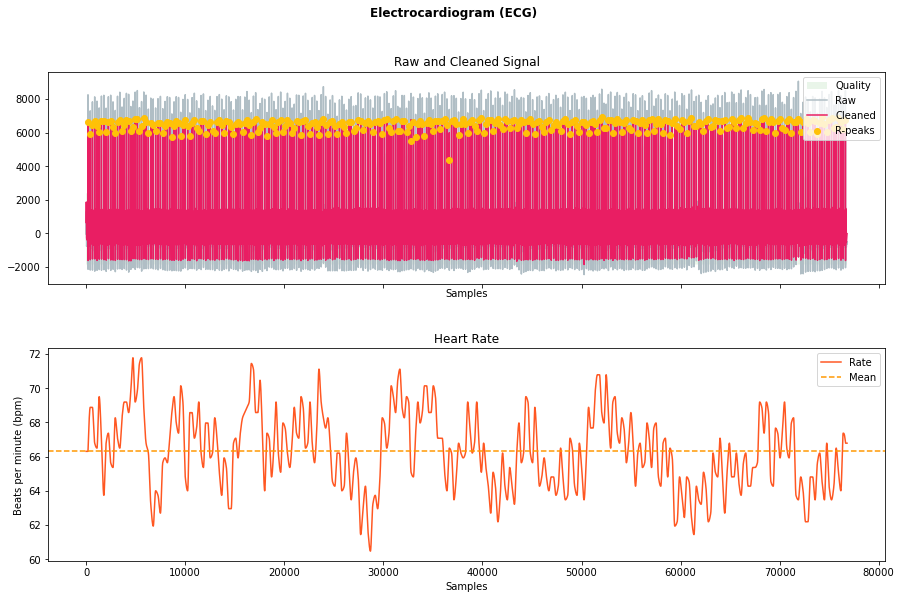

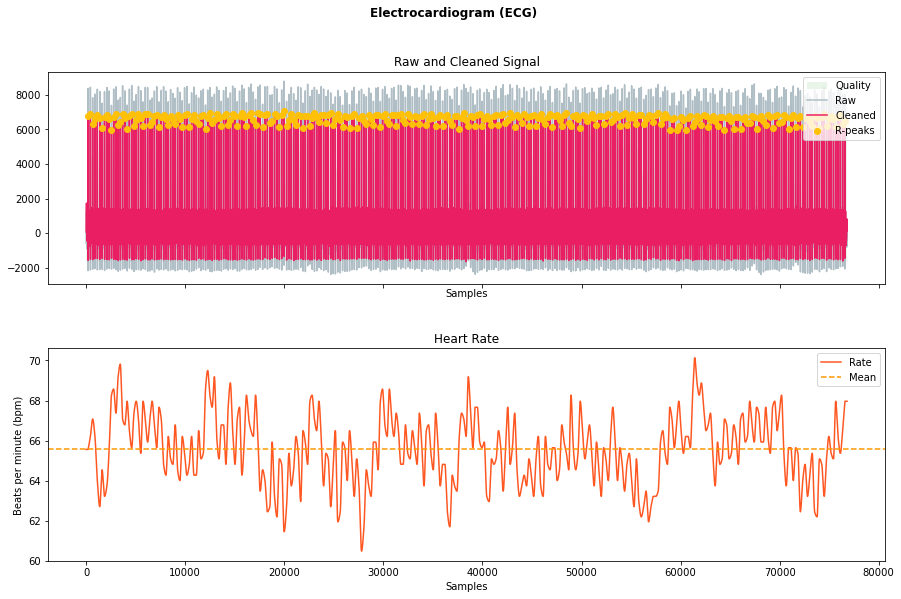

...

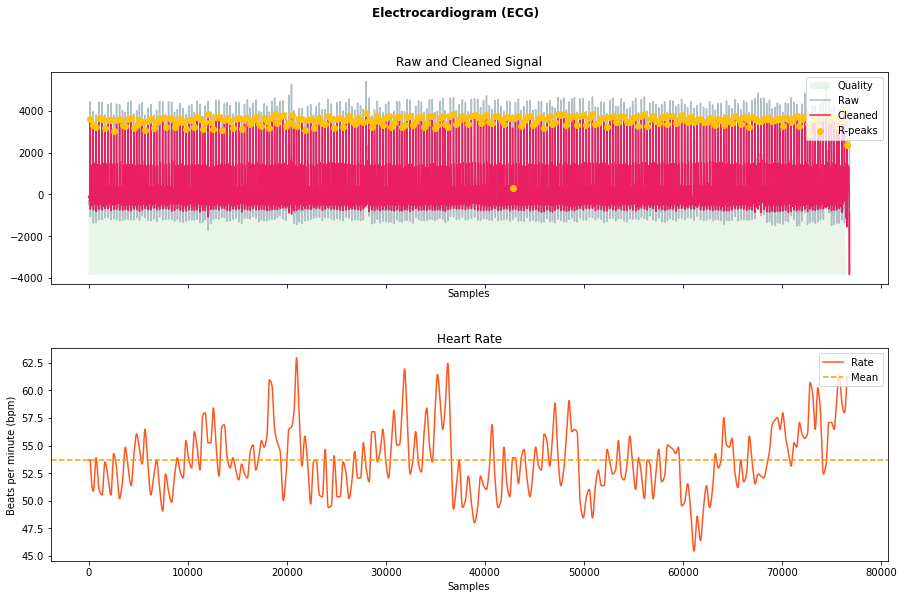

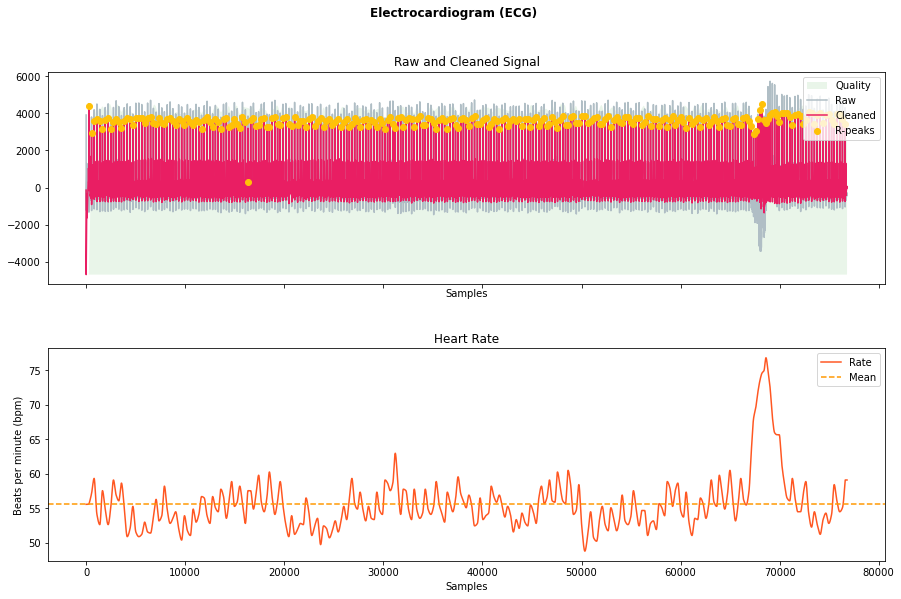

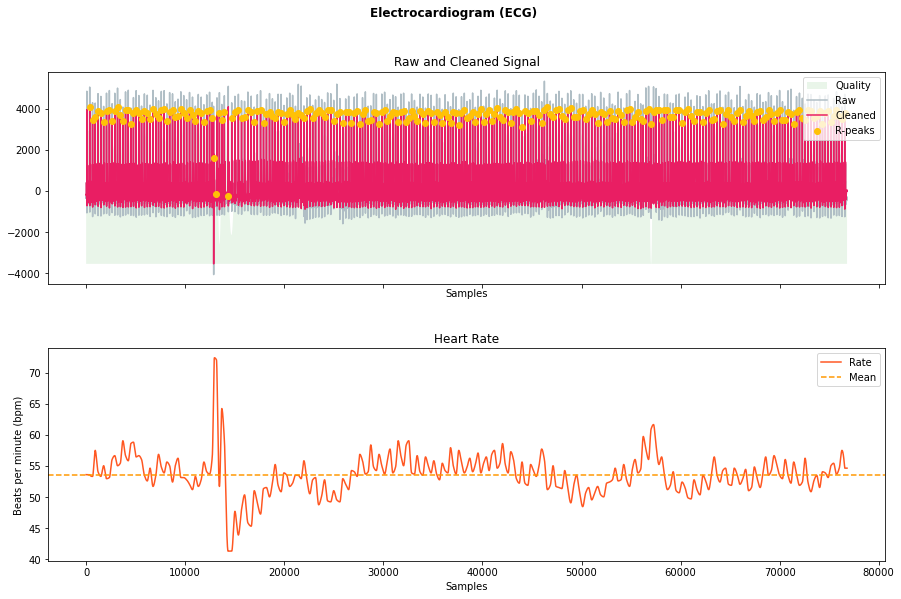

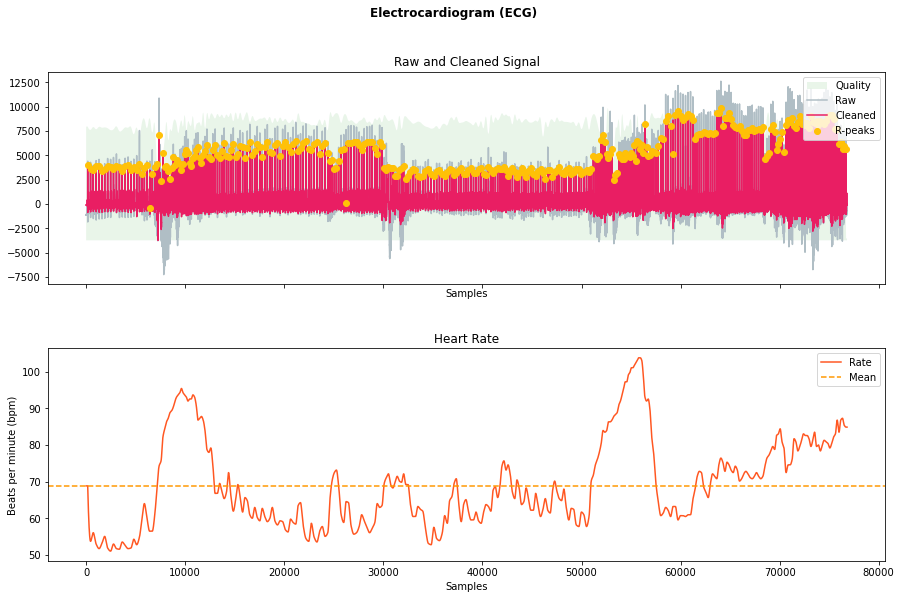

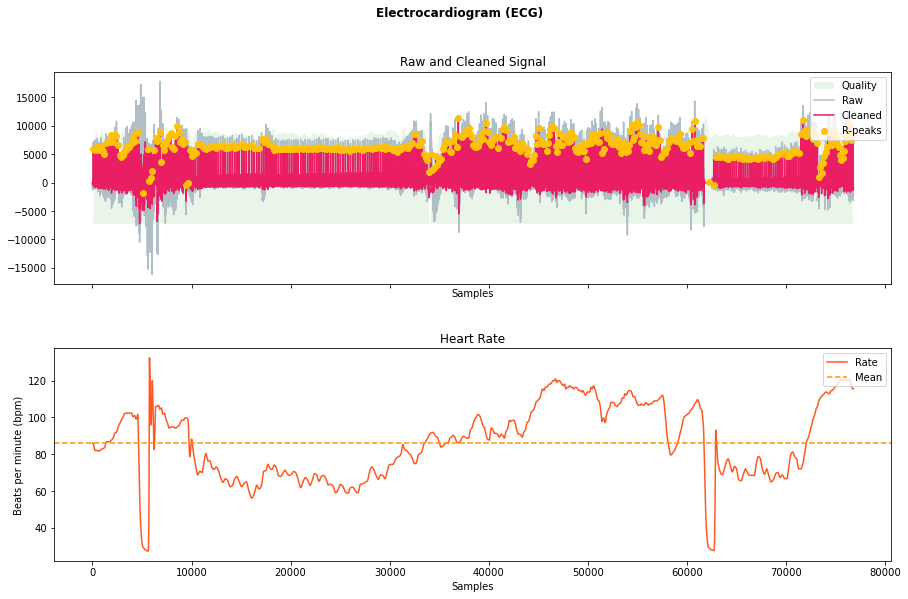

In [28]:
#results
hrv_results,hrv_process,hrv_info = prepedf.analyse_segments(idp, fs, segments, night, dia, True)
#testplot(segment)
#test_analyze(segment)

In [29]:
hrv_results

,stadium,dia,idp,ECG_Rate_Mean,HRV_RMSSD,HRV_MeanNN,HRV_SDNN,HRV_SDSD,HRV_CVNN,HRV_CVSD,...,HRV_Ca,HRV_SDNNd,HRV_SDNNa,HRV_ApEn,HRV_SampEn,HRV_MSE,HRV_CMSE,HRV_RCMSE,HRV_DFA,HRV_CorrDim
0,Wach,IHS,000,81.458722,15.876781,736.593364,48.499974,15.896172,0.065844,0.021554,...,0.525396,33.447002,35.191242,0.815232,0.818601,0.713858,1.131723,2.026869,1.279389,1.076297
1,Wach,IHS,000,77.316506,17.065412,776.085633,38.511362,17.087528,0.049623,0.021989,...,0.488480,27.571240,26.943138,1.103743,1.431367,0.869076,1.175954,1.978392,1.003017,1.035534
2,Wach,IHS,000,73.016258,24.557676,821.825635,40.985705,24.591287,0.049872,0.029882,...,0.446954,30.501218,27.420055,1.020365,1.162460,0.775810,1.239984,1.510343,1.345672,1.088648
3,N2,IHS,000,66.312176,25.086265,904.912405,30.468709,25.124339,0.033670,0.027722,...,0.478968,22.005162,21.098205,1.122557,1.883875,1.269301,1.605163,1.813068,1.093870,1.573185
4,N3,IHS,000,65.562835,23.118827,915.260736,24.086882,23.154364,0.026317,0.025259,...,0.516818,16.743622,17.316625,1.222668,1.724010,1.239263,1.516022,1.657137,1.019897,1.562845
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,Rem,IHS,000,53.725802,53.199259,1117.260651,60.960628,53.294259,0.054563,0.047616,...,0.509303,42.537805,43.336801,1.156567,1.811675,0.893395,1.510029,2.014854,1.021042,1.546786
60,Rem,IHS,000,55.562500,49.941705,1080.163043,71.538735,50.032593,0.066230,0.046235,...,0.540235,48.552404,52.630100,1.109948,1.517456,0.718805,1.436815,1.468868,1.274836,1.308525
61,Rem,IHS,000,53.638549,62.538222,1119.052514,68.233803,62.656468,0.060975,0.055885,...,0.446381,50.860720,45.669901,1.138982,1.619334,0.794895,1.294034,1.672832,1.047434,0.974144
62,Wach,IHS,000,68.837663,40.285474,871.708728,146.216098,40.326619,0.167735,0.046214,...,0.540596,98.952514,107.341082,0.785264,0.688726,0.558594,1.023562,1.997581,1.510126,1.207219


In [30]:
selected = [2,30,36]
hrv_resultss = prepedf.clean_df_from_bad_signal(hrv_results, idp, night, selected)
hrv_resultss

,stadium,dia,idp,ECG_Rate_Mean,HRV_RMSSD,HRV_MeanNN,HRV_SDNN,HRV_SDSD,HRV_CVNN,HRV_CVSD,...,HRV_Ca,HRV_SDNNd,HRV_SDNNa,HRV_ApEn,HRV_SampEn,HRV_MSE,HRV_CMSE,HRV_RCMSE,HRV_DFA,HRV_CorrDim
0,Wach,IHS,000,81.458722,15.876781,736.593364,48.499974,15.896172,0.065844,0.021554,...,0.525396,33.447002,35.191242,0.815232,0.818601,0.713858,1.131723,2.026869,1.279389,1.076297
1,Wach,IHS,000,77.316506,17.065412,776.085633,38.511362,17.087528,0.049623,0.021989,...,0.488480,27.571240,26.943138,1.103743,1.431367,0.869076,1.175954,1.978392,1.003017,1.035534
3,N2,IHS,000,66.312176,25.086265,904.912405,30.468709,25.124339,0.033670,0.027722,...,0.478968,22.005162,21.098205,1.122557,1.883875,1.269301,1.605163,1.813068,1.093870,1.573185
4,N3,IHS,000,65.562835,23.118827,915.260736,24.086882,23.154364,0.026317,0.025259,...,0.516818,16.743622,17.316625,1.222668,1.724010,1.239263,1.516022,1.657137,1.019897,1.562845
5,N3,IHS,000,65.761431,22.929739,912.473719,23.025383,22.964960,0.025234,0.025129,...,0.468983,16.765449,15.755764,1.315054,1.814825,1.088445,1.532594,1.589108,1.077940,1.513592
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,Rem,IHS,000,53.725802,53.199259,1117.260651,60.960628,53.294259,0.054563,0.047616,...,0.509303,42.537805,43.336801,1.156567,1.811675,0.893395,1.510029,2.014854,1.021042,1.546786
60,Rem,IHS,000,55.562500,49.941705,1080.163043,71.538735,50.032593,0.066230,0.046235,...,0.540235,48.552404,52.630100,1.109948,1.517456,0.718805,1.436815,1.468868,1.274836,1.308525
61,Rem,IHS,000,53.638549,62.538222,1119.052514,68.233803,62.656468,0.060975,0.055885,...,0.446381,50.860720,45.669901,1.138982,1.619334,0.794895,1.294034,1.672832,1.047434,0.974144
62,Wach,IHS,000,68.837663,40.285474,871.708728,146.216098,40.326619,0.167735,0.046214,...,0.540596,98.952514,107.341082,0.785264,0.688726,0.558594,1.023562,1.997581,1.510126,1.207219
